# Define more detailed trajectories

## load necessary packages

In [41]:
from IPython.display import display, HTML
display(HTML("<style>.container { width:90% !important; }</style>"))
%matplotlib inline

import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
import scvelo as scv
import scanpy as sc
import numpy as np


In [2]:
scv.settings.verbosity = 3  # show errors(0), warnings(1), info(2), hints(3)
scv.settings.presenter_view = True  # set max width size for presenter view
sc.set_figure_params(dpi = 80)
sns.set_style("white")
sns.set_context("talk")
sns.set_style("ticks")

In [3]:
greens_r = sns.blend_palette(['black','#238b45', '#75c477', '#c8e9c1' ], as_cmap = True)
purples_r = sns.blend_palette(['black','#6a51a3', '#9e9bc8', '#dadaeb'], as_cmap = True)
oranges_r = sns.blend_palette(['black','#d94801', '#fd8e3d', '#fdd1a3'], as_cmap = True)

k27_k4 = sns.blend_palette(['#6a51a3', '#9e9bc8', '#dadaeb','#c8e9c1','#75c477','#238b45'], as_cmap = True)
k4_k27 = sns.blend_palette(['#238b45', '#75c477', '#c8e9c1' ,'#dadaeb','#9e9bc8','#6a51a3' ], as_cmap = True)
Green='#238b45'
Purple='#6a51a3'
Orange='#d94801'

cols = ['grey','skyblue','orange','red']
cols2 = ['white','deepskyblue','orange','red','grey']

leg_dict2 = {'negative': 'grey','positive': 'skyblue','going up': 'orange','going down': 'red'}
coldict=dict(zip(list(pd.DataFrame([0,1,2,3,4]).astype('category')[0]), cols2))
leg_dict = {'negative': 'white', 'positive': 'deepskyblue', 'going up': 'orange', 'going down': 'red'}

## Load the dataset

In [4]:
adata = sc.read_h5ad('../../tchic_local/fig6_build/legacy/data/20230704_adata_all.h5ad')
adata

AnnData object with n_obs × n_vars = 38117 × 27384
    obs: 'batch', 'day', 'replicates', 'mark', 'day_rep', 'dataset', 'hour', 'celltype', 'celltype_general', 'lineage', 'lin_day', 'percent_mito', 'n_counts', 'n_counts_proteincoding', 'n_genes', 'S_score', 'G2M_score', 'phase', 'enrichment', 'coverage', 'QC', 'pseudotime', 'pseudotime2'
    var: 'Accession', 'Chromosome', 'End', 'Start', 'Strand', 'gene', 'gene_biotype', 'gene_counts', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
    uns: 'QC_colors', 'batch_colors', 'celltype_colors', 'celltype_general_colors', 'dataset_colors', 'day_colors', 'hour_colors', 'hvg', 'leiden', 'leiden_colors', 'lin_day_colors', 'lineage_colors', 'log1p', 'mark_colors', 'neighbors', 'old_celltype_colors', 'old_leiden_general_colors', 'old_leiden_merge_colors', 'pca', 'phase_colors', 'predicted_final_colors', 'predicted_id_E75_colors', 'predicted_id_E85_colors', 'replicates_colors', 'umap', 'umap_density_mark_par

In [5]:
color_pal = dict(zip(adata.obs['celltype'].cat.categories,adata.uns[str('celltype') + '_colors']))

In [6]:
color_pal['Roof Plate Neural Tube 1'] = 'powderblue'

In [7]:
color_pal

{'mESCs': '#008080',
 'Primitive Streak': '#3cb371',
 'Caudal Epiblast': '#228b22',
 'Epiblast': '#98fb98',
 'Naive PGCs': '#9acd32',
 'Epidermis Progenitors': '#20b2aa',
 'Caudal Mesoderm': '#ff69b4',
 'Parietal Endoderm': '#d2691e',
 'PGCs': '#ffd700',
 'preSomitic/Wavefront': '#ff6347',
 'Nascent Mesoderm': '#d8bfd8',
 'NMPs': '#4169e1',
 'LP/Intermediate Mesoderm': '#8a2be2',
 'Neural Progenitors': '#00ffff',
 'Somite': '#ffe4e1',
 'Cardiac Mesoderm': '#dc143c',
 'Endothelium': '#708090',
 'Visceral Endoderm': '#ff8c00',
 'Dermomyotome': '#cd5c5c',
 'Erythrocytes': '#b0c4de',
 'Reprogramming PGCs': '#adff2f',
 'Sclerotome': '#dda0dd',
 'Roof Plate Neural Tube': '#00bfff',
 'Floor Plate Neural Tube': '#000080',
 'ExE Endoderm': '#8b4513',
 'Cardiomyocytes': '#4b0082',
 'Pharyngeal Mesoderm': '#8b0000',
 'Early Motor Neurons': '#1e90ff',
 'Late Motor Neurons': '#b0e0e6',
 'Myotome': '#800000',
 'Megakaryocytes': '#2f4f4f',
 'Roof Plate Neural Tube 1': 'powderblue'}

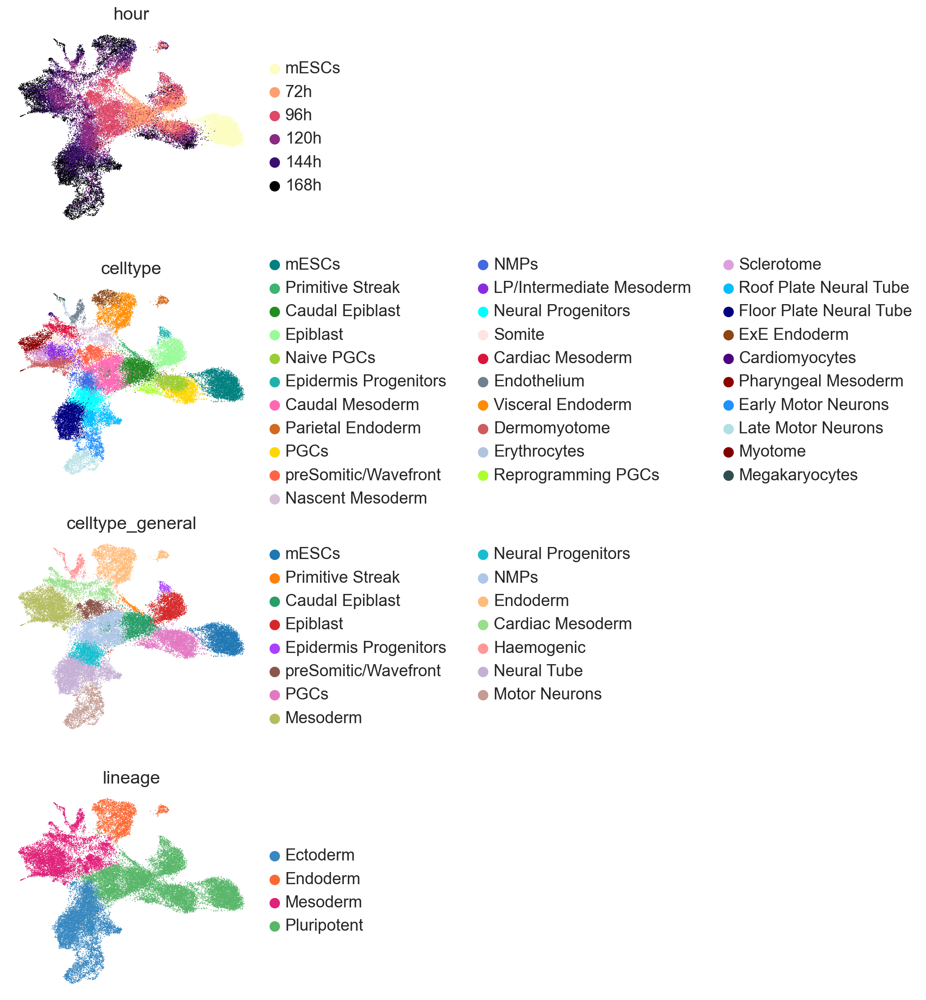

In [8]:
sc.pl.umap(adata,color = ['hour','celltype','celltype_general','lineage'],ncols=1, frameon=False)

## define trajectories

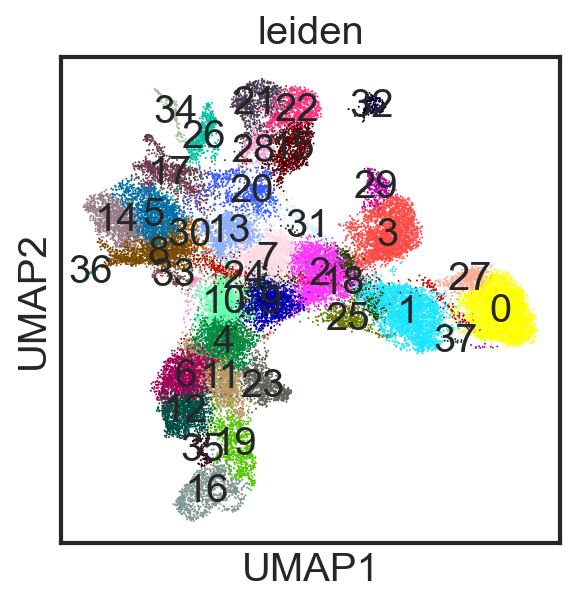

In [9]:
sc.tl.leiden(adata,resolution=1.5)
sc.pl.umap(adata,color = 'leiden', legend_loc = 'on data', legend_fontweight = 'light')

In [10]:
adata.obs['celltype'] = adata.obs['celltype'].astype(str)
adata.obs.loc[adata.obs.index.isin(adata.obs[adata.obs['leiden'] == '11'].index),"celltype"] = 'Roof Plate Neural Tube 1'

In [11]:
adata.obs['celltype'] = adata.obs['celltype'].astype('category')

In [12]:
adata.obs['celltype'] = adata.obs['celltype'].cat.reorder_categories(color_pal.keys())

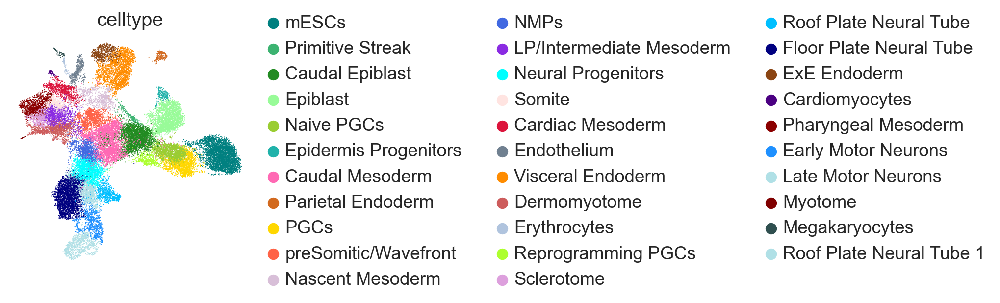

In [13]:
sc.pl.umap(adata,color = ['celltype'],ncols=1, frameon=False, palette = list(color_pal.values()))

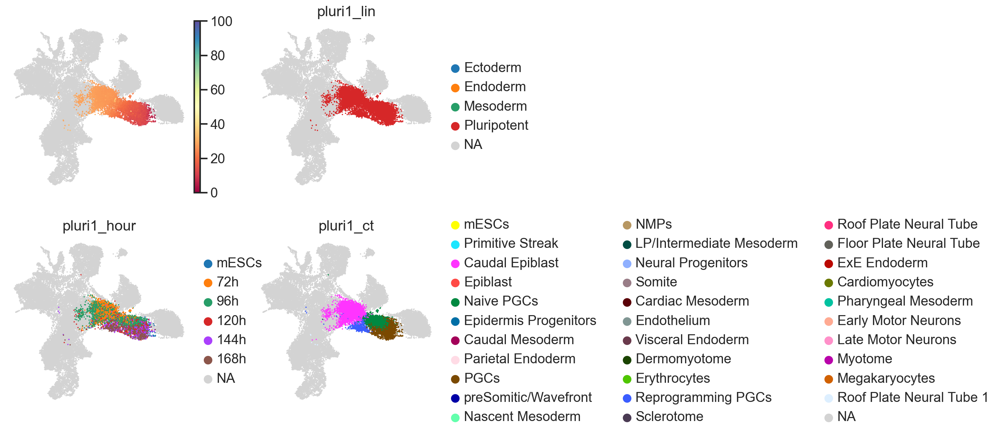

In [14]:
pseudo = pd.DataFrame(adata.obs['pseudotime'])#.rename(columns={'PT1':'pseudotime'})
pseudo = pseudo[(adata.obs['lineage'] == 'Pluripotent')]
#pseudo = pseudo[adata.obs['celltype_general'] != 'PGCs']
pseudo = pseudo[adata.obs['celltype'] != 'Epidermis Progenitors']
pseudo = pseudo[adata.obs['celltype'] != 'Primitive Streak']
pseudo = pseudo[adata.obs['celltype'] != 'Caudal Mesoderm']
pseudo = pseudo[adata.obs['celltype'] != 'Epiblast']
pseudo = pseudo[adata.obs['celltype_general'] != 'mESCs']

adata.obs['pluri1_pseudo'] = adata.obs.loc[pseudo.index]['pseudotime']
adata.obs['pluri1_hour'] = adata.obs.loc[pseudo.index]['hour']
adata.obs['pluri1_lin'] = adata.obs.loc[pseudo.index]['lineage']
adata.obs['pluri1_ct'] = adata.obs.loc[pseudo.index]['celltype']
adata.obs['pluri1_ld'] = adata.obs.loc[pseudo.index]['lin_day']
sc.pl.umap(adata,color = ['pluri1_pseudo','pluri1_lin','pluri1_hour','pluri1_ct'], frameon = False, cmap = 'Spectral',size = 10, ncols = 2,vmin = 0, vmax = 100, title = '')

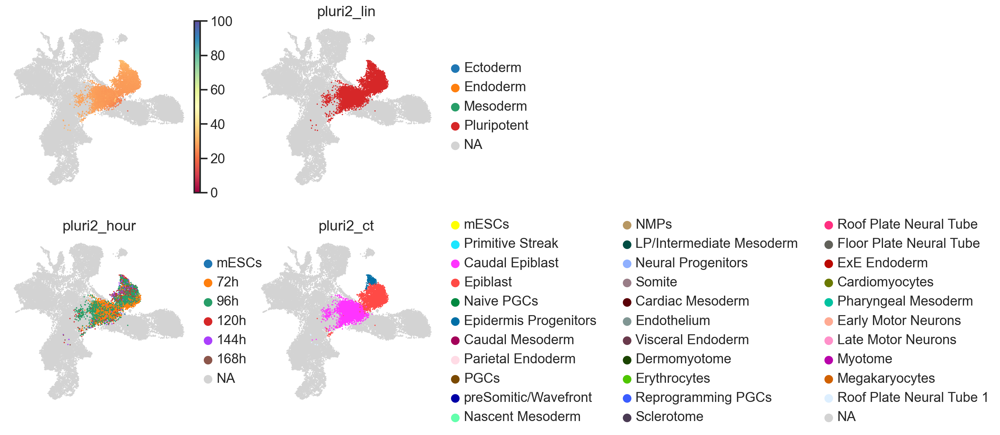

In [15]:
pseudo = pd.DataFrame(adata.obs['pseudotime'])#.rename(columns={'PT1':'pseudotime'})
pseudo = pseudo[(adata.obs['lineage'] == 'Pluripotent')]
pseudo = pseudo[adata.obs['celltype_general'] != 'PGCs']
pseudo = pseudo[adata.obs['celltype'] != 'Primitive Streak']
pseudo = pseudo[adata.obs['celltype'] != 'Caudal Mesoderm']
pseudo = pseudo[adata.obs['celltype_general'] != 'mESCs']

adata.obs['pluri2_pseudo'] = adata.obs.loc[pseudo.index]['pseudotime']
adata.obs['pluri2_hour'] = adata.obs.loc[pseudo.index]['hour']
adata.obs['pluri2_lin'] = adata.obs.loc[pseudo.index]['lineage']
adata.obs['pluri2_ct'] = adata.obs.loc[pseudo.index]['celltype']
adata.obs['pluri2_ld'] = adata.obs.loc[pseudo.index]['lin_day']
sc.pl.umap(adata,color = ['pluri2_pseudo','pluri2_lin','pluri2_hour','pluri2_ct'], frameon = False, cmap = 'Spectral',size = 10, ncols = 2,vmin = 0, vmax = 100, title = '')

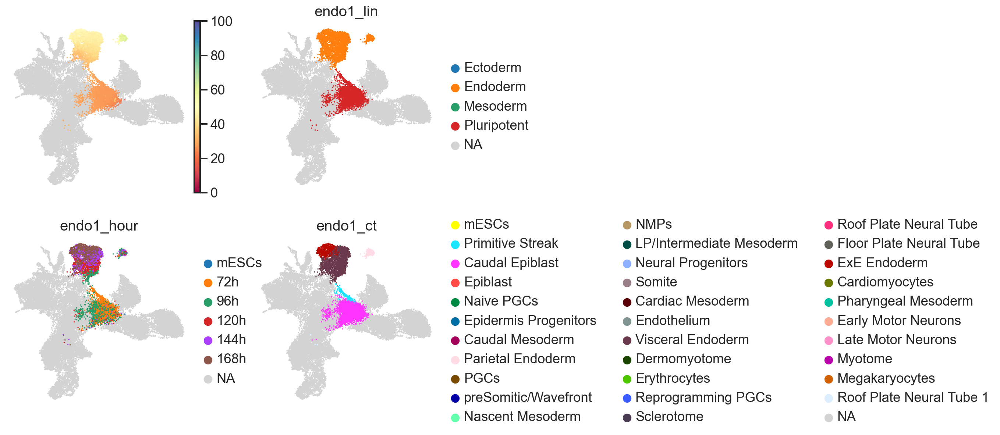

In [16]:
pseudo = pd.DataFrame(adata.obs['pseudotime'])#.rename(columns={'PT1':'pseudotime'})
pseudo = pseudo[(adata.obs['lineage'] == 'Pluripotent') #| (adata.obs['lineage'] == 'Mesoderm') 
| (adata.obs['lineage'] == 'Endoderm')]
#pseudo = pseudo[adata.obs['celltype_general'] != 'Mesoderm']
#pseudo = pseudo[adata.obs['celltype_general'] != 'Haemogenic']
pseudo = pseudo[adata.obs['celltype'] != 'Caudal Mesoderm']
#pseudo = pseudo[adata.obs['celltype'] != 'Cardiomyocytes']
pseudo = pseudo[adata.obs['celltype_general'] != 'PGCs']
pseudo = pseudo[adata.obs['celltype'] != 'Epidermis Progenitors']
pseudo = pseudo[adata.obs['celltype'] != 'Epiblast']
pseudo = pseudo[adata.obs['celltype_general'] != 'mESCs']

adata.obs['endo1_pseudo'] = adata.obs.loc[pseudo.index]['pseudotime']
adata.obs['endo1_hour'] = adata.obs.loc[pseudo.index]['hour']
adata.obs['endo1_lin'] = adata.obs.loc[pseudo.index]['lineage']
adata.obs['endo1_ct'] = adata.obs.loc[pseudo.index]['celltype']
adata.obs['endo1_ld'] = adata.obs.loc[pseudo.index]['lin_day']
sc.pl.umap(adata,color = ['endo1_pseudo','endo1_lin','endo1_hour','endo1_ct'], frameon = False, cmap = 'Spectral',size = 10, ncols = 2,vmin = 0, vmax = 100, title = '')

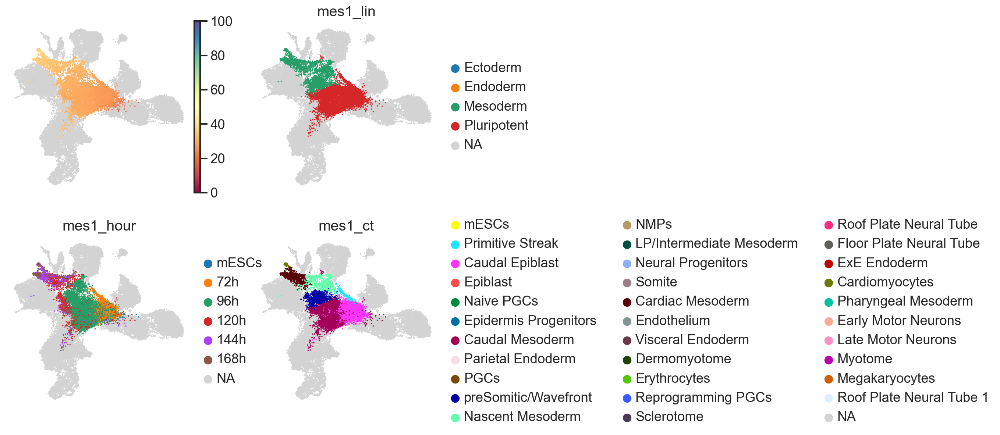

In [17]:
pseudo = pd.DataFrame(adata.obs['pseudotime'])#.rename(columns={'PT1':'pseudotime'})
pseudo = pseudo[(adata.obs['lineage'] == 'Pluripotent') | (adata.obs['lineage'] == 'Mesoderm')]
pseudo = pseudo[adata.obs['celltype_general'] != 'Haemogenic']
pseudo = pseudo[adata.obs['celltype_general'] != 'Mesoderm']
pseudo = pseudo[adata.obs['celltype_general'] != 'PGCs']
pseudo = pseudo[adata.obs['celltype'] != 'Epidermis Progenitors']
pseudo = pseudo[adata.obs['celltype'] != 'Epiblast']
pseudo = pseudo[adata.obs['celltype_general'] != 'mESCs']

adata.obs['mes1_pseudo'] = adata.obs.loc[pseudo.index]['pseudotime']
adata.obs['mes1_hour'] = adata.obs.loc[pseudo.index]['hour']
adata.obs['mes1_lin'] = adata.obs.loc[pseudo.index]['lineage']
adata.obs['mes1_ct'] = adata.obs.loc[pseudo.index]['celltype']
adata.obs['mes1_ld'] = adata.obs.loc[pseudo.index]['lin_day']
sc.pl.umap(adata,color = ['mes1_pseudo','mes1_lin','mes1_hour','mes1_ct'], frameon = False, cmap = 'Spectral',size = 10, ncols = 2,vmin = 0, vmax = 100, title = '')

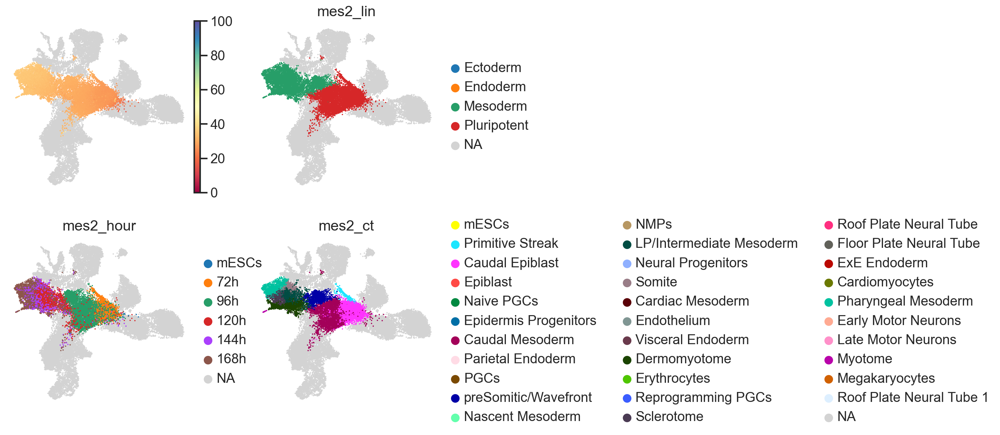

In [18]:
pseudo = pd.DataFrame(adata.obs['pseudotime'])#.rename(columns={'PT1':'pseudotime'})
pseudo = pseudo[(adata.obs['lineage'] == 'Pluripotent') | (adata.obs['lineage'] == 'Mesoderm')]
pseudo = pseudo[adata.obs['celltype_general'] != 'Haemogenic']
pseudo = pseudo[adata.obs['celltype_general'] != 'Cardiac Mesoderm']
pseudo = pseudo[adata.obs['celltype_general'] != 'PGCs']
pseudo = pseudo[adata.obs['celltype'] != 'Epidermis Progenitors']
pseudo = pseudo[adata.obs['celltype'] != 'Epiblast']
pseudo = pseudo[adata.obs['celltype_general'] != 'mESCs']

adata.obs['mes2_pseudo'] = adata.obs.loc[pseudo.index]['pseudotime']
adata.obs['mes2_hour'] = adata.obs.loc[pseudo.index]['hour']
adata.obs['mes2_lin'] = adata.obs.loc[pseudo.index]['lineage']
adata.obs['mes2_ct'] = adata.obs.loc[pseudo.index]['celltype']
adata.obs['mes2_ld'] = adata.obs.loc[pseudo.index]['lin_day']
sc.pl.umap(adata,color = ['mes2_pseudo','mes2_lin','mes2_hour','mes2_ct'], frameon = False, cmap = 'Spectral',size = 10, ncols = 2,vmin = 0, vmax = 100, title = '')

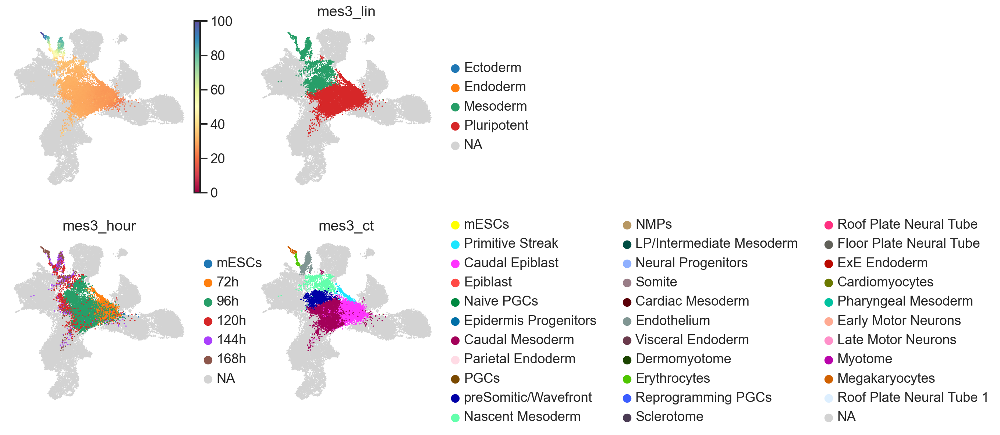

In [19]:
pseudo = pd.DataFrame(adata.obs['pseudotime'])#.rename(columns={'PT1':'pseudotime'})
pseudo = pseudo[(adata.obs['lineage'] == 'Pluripotent') | (adata.obs['lineage'] == 'Mesoderm')]
pseudo = pseudo[adata.obs['celltype_general'] != 'Mesoderm']
pseudo = pseudo[adata.obs['celltype'] != 'Cardiac Mesoderm']
pseudo = pseudo[adata.obs['celltype'] != 'Cardiomyocytes']
pseudo = pseudo[adata.obs['celltype_general'] != 'PGCs']
pseudo = pseudo[adata.obs['celltype'] != 'Epidermis Progenitors']
pseudo = pseudo[adata.obs['celltype'] != 'Epiblast']
pseudo = pseudo[adata.obs['celltype_general'] != 'mESCs']

adata.obs['mes3_pseudo'] = adata.obs.loc[pseudo.index]['pseudotime']
adata.obs['mes3_hour'] = adata.obs.loc[pseudo.index]['hour']
adata.obs['mes3_lin'] = adata.obs.loc[pseudo.index]['lineage']
adata.obs['mes3_ct'] = adata.obs.loc[pseudo.index]['celltype']
adata.obs['mes3_ld'] = adata.obs.loc[pseudo.index]['lin_day']
sc.pl.umap(adata,color = ['mes3_pseudo','mes3_lin','mes3_hour','mes3_ct'], frameon = False, cmap = 'Spectral',size = 10, ncols = 2,vmin = 0, vmax = 100, title = '')

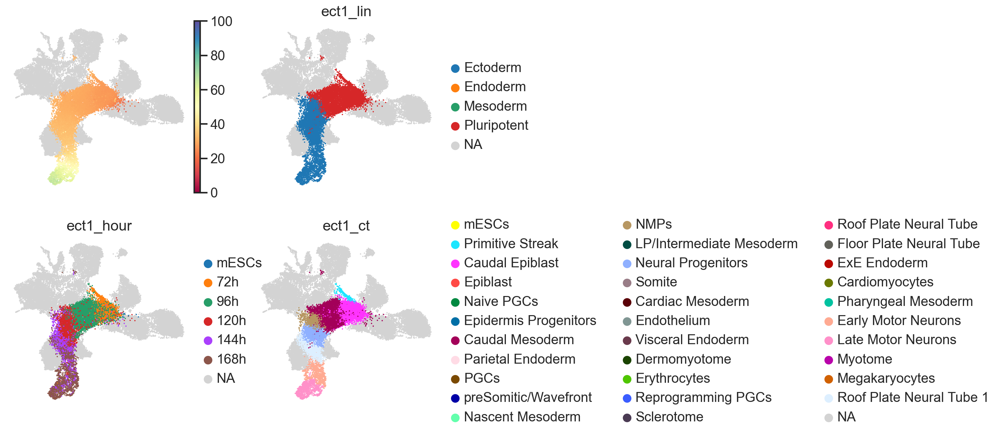

In [20]:
pseudo = pd.DataFrame(adata.obs['pseudotime'])#.rename(columns={'PT1':'pseudotime'})
pseudo = pseudo[(adata.obs['lineage'] == 'Pluripotent') | (adata.obs['lineage'] == 'Ectoderm')]
pseudo = pseudo[adata.obs['celltype_general'] != 'PGCs']
pseudo = pseudo[adata.obs['celltype'] != 'Epidermis Progenitors']
pseudo = pseudo[adata.obs['celltype'] != 'Epiblast']
pseudo = pseudo[adata.obs['celltype_general'] != 'mESCs']
pseudo = pseudo[adata.obs['celltype'] != 'Floor Plate Neural Tube']
pseudo = pseudo[adata.obs['celltype'] != 'Roof Plate Neural Tube']



adata.obs['ect1_pseudo'] = adata.obs.loc[pseudo.index]['pseudotime']
adata.obs['ect1_hour'] = adata.obs.loc[pseudo.index]['hour']
adata.obs['ect1_lin'] = adata.obs.loc[pseudo.index]['lineage']
adata.obs['ect1_ct'] = adata.obs.loc[pseudo.index]['celltype']
adata.obs['ect1_ld'] = adata.obs.loc[pseudo.index]['lin_day']
sc.pl.umap(adata,color = ['ect1_pseudo','ect1_lin','ect1_hour','ect1_ct'], frameon = False, cmap = 'Spectral',size = 10, ncols = 2,vmin = 0, vmax = 100, title = '')

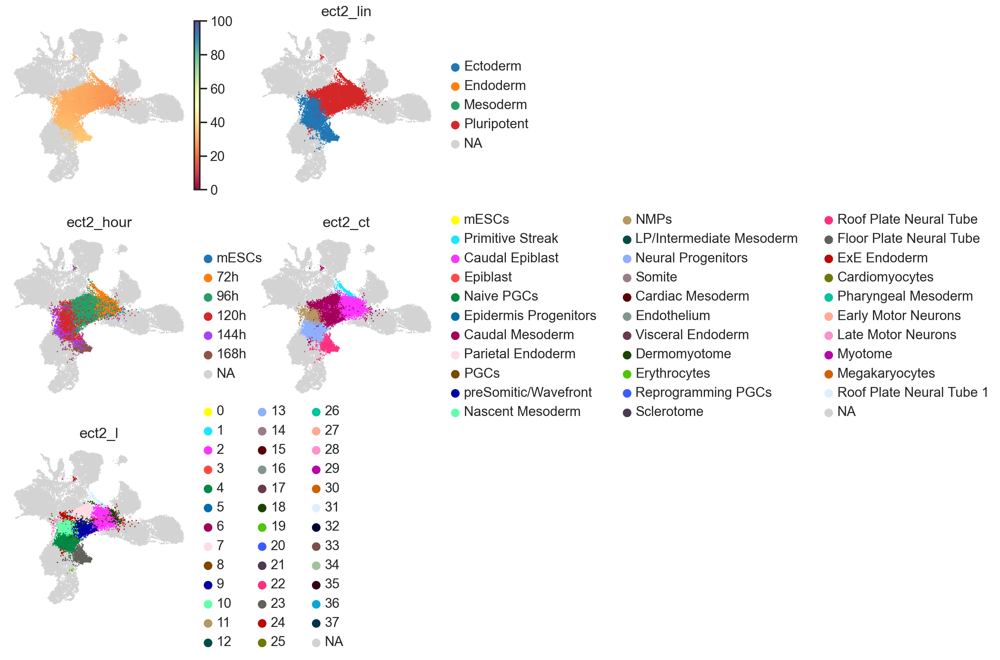

In [21]:
pseudo = pd.DataFrame(adata.obs['pseudotime'])#.rename(columns={'PT1':'pseudotime'})
pseudo = pseudo[(adata.obs['lineage'] == 'Pluripotent') | (adata.obs['lineage'] == 'Ectoderm')]
pseudo = pseudo[adata.obs['celltype_general'] != 'PGCs']
pseudo = pseudo[adata.obs['celltype'] != 'Epidermis Progenitors']
pseudo = pseudo[adata.obs['celltype'] != 'Epiblast']
pseudo = pseudo[adata.obs['celltype_general'] != 'Motor Neurons']
pseudo = pseudo[adata.obs['celltype_general'] != 'mESCs']
pseudo = pseudo[adata.obs['celltype'] != 'Floor Plate Neural Tube']
pseudo = pseudo[(adata.obs['celltype'] != 'Roof Plate Neural Tube 1')  ]

adata.obs['ect2_pseudo'] = adata.obs.loc[pseudo.index]['pseudotime']
adata.obs['ect2_hour'] = adata.obs.loc[pseudo.index]['hour']
adata.obs['ect2_lin'] = adata.obs.loc[pseudo.index]['lineage']
adata.obs['ect2_ct'] = adata.obs.loc[pseudo.index]['celltype']
adata.obs['ect2_ld'] = adata.obs.loc[pseudo.index]['lin_day']
adata.obs['ect2_l'] = adata.obs.loc[pseudo.index]['leiden']
sc.pl.umap(adata,color = ['ect2_pseudo','ect2_lin','ect2_hour','ect2_ct','ect2_l'], frameon = False, cmap = 'Spectral',size = 10, ncols = 2,vmin = 0, vmax = 100, title = '')

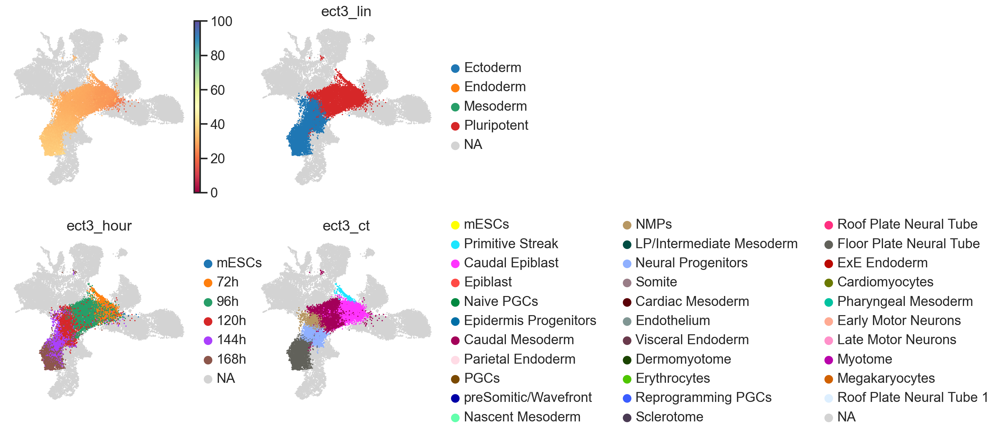

In [22]:
pseudo = pd.DataFrame(adata.obs['pseudotime'])#.rename(columns={'PT1':'pseudotime'})
pseudo = pseudo[(adata.obs['lineage'] == 'Pluripotent') | (adata.obs['lineage'] == 'Ectoderm')]
pseudo = pseudo[adata.obs['celltype_general'] != 'PGCs']
pseudo = pseudo[adata.obs['celltype'] != 'Epidermis Progenitors']
pseudo = pseudo[adata.obs['celltype'] != 'Epiblast']
pseudo = pseudo[adata.obs['celltype'] != 'Roof Plate Neural Tube']
pseudo = pseudo[adata.obs['celltype'] != 'Roof Plate Neural Tube 1']
pseudo = pseudo[adata.obs['celltype_general'] != 'Motor Neurons']
pseudo = pseudo[adata.obs['celltype_general'] != 'mESCs']

adata.obs['ect3_pseudo'] = adata.obs.loc[pseudo.index]['pseudotime']
adata.obs['ect3_hour'] = adata.obs.loc[pseudo.index]['hour']
adata.obs['ect3_lin'] = adata.obs.loc[pseudo.index]['lineage']
adata.obs['ect3_ct'] = adata.obs.loc[pseudo.index]['celltype']
adata.obs['ect3_ld'] = adata.obs.loc[pseudo.index]['lin_day']
sc.pl.umap(adata,color = ['ect3_pseudo','ect3_lin','ect3_hour','ect3_ct'], frameon = False, cmap = 'Spectral',size = 10, ncols = 2,vmin = 0, vmax = 100, title = '')

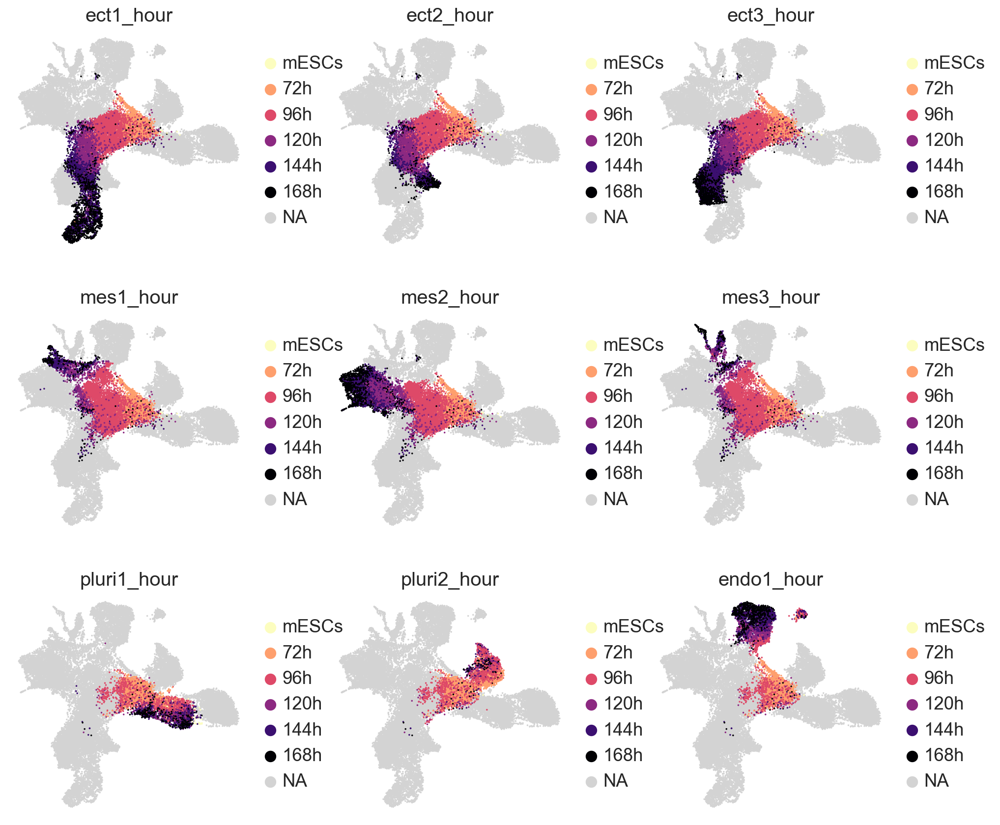

In [23]:
sc.pl.umap(adata,color = ['ect1_hour','ect2_hour','ect3_hour',
                         'mes1_hour','mes2_hour','mes3_hour',
                         'pluri1_hour','pluri2_hour','endo1_hour'], frameon = False, palette = 'magma_r',size = 10, ncols = 3,vmin = 0, vmax = 100)

In [24]:
adata.uns['ect1_ld_colors'] = adata.uns['lin_day_colors']
adata.uns['ect2_ld_colors']= adata.uns['lin_day_colors']
adata.uns['ect3_ld_colors']= adata.uns['lin_day_colors']
adata.uns['mes1_ld_colors']= adata.uns['lin_day_colors']
adata.uns['mes2_ld_colors']= adata.uns['lin_day_colors']
adata.uns['mes3_ld_colors']= adata.uns['lin_day_colors']
adata.uns['pluri1_ld_colors']= adata.uns['lin_day_colors']
adata.uns['pluri2_ld_colors']= adata.uns['lin_day_colors']
adata.uns['endo1_ld_colors']= adata.uns['lin_day_colors']

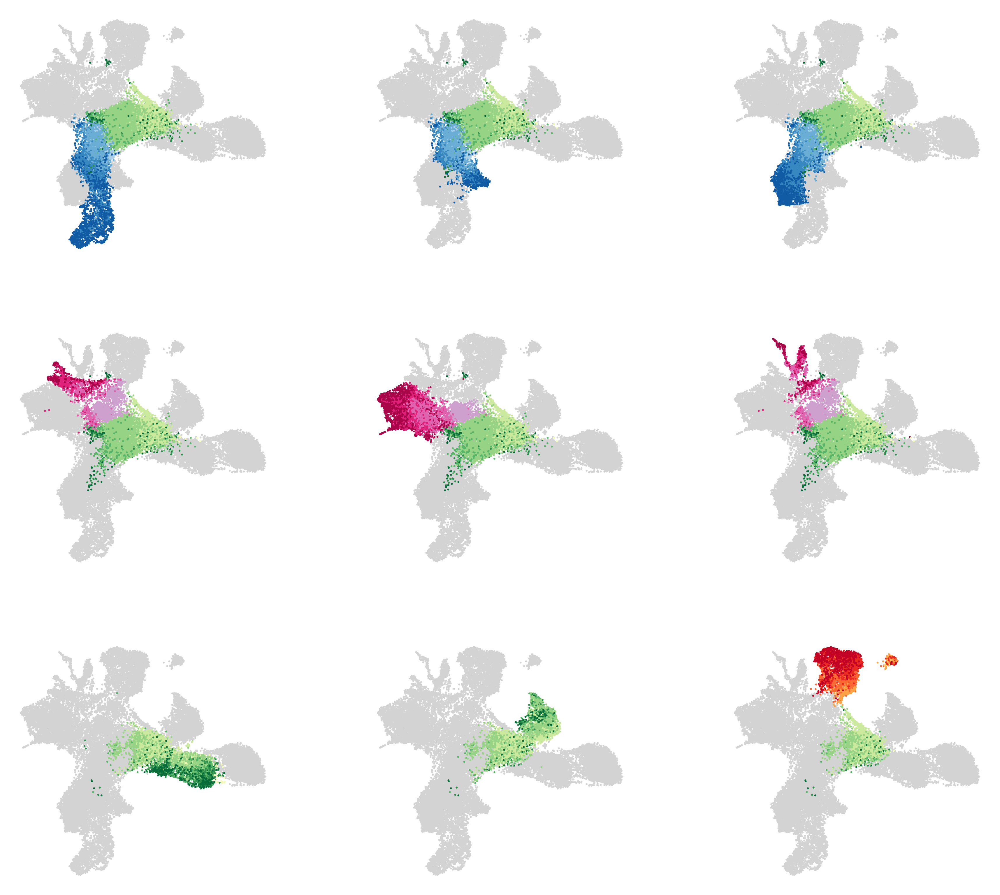

In [25]:
sc.set_figure_params(dpi=150)
sc.pl.umap(adata,color = ['ect1_ld','ect2_ld','ect3_ld',
                         'mes1_ld','mes2_ld','mes3_ld',
                          'pluri1_ld','pluri2_ld','endo1_ld'],
           frameon = False, cmap = 'Spectral',size = 10, ncols = 3, legend_loc = None,vmin = 0, vmax = 100, 
          title = ['','','','','','','','',''])

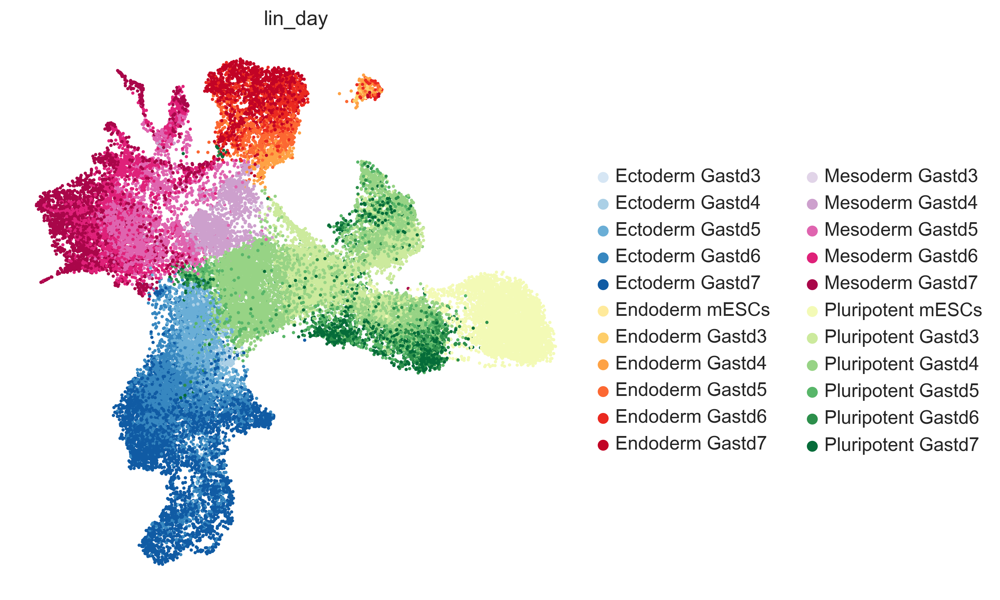

In [26]:
#adata.obs['ct2'] = adata.obs['celltype']
fig,ax=plt.subplots(figsize=(7,7))
sc.pl.umap(adata,color = ['lin_day'],#palette = cols3,
           ncols=1,ax=ax, size = 20,frameon=False)

In [27]:
list1 = ['ect1_ct','ect2_ct','ect3_ct',
                         'mes1_ct','mes2_ct','mes3_ct',
                         'pluri1_ct','pluri2_ct','endo1_ct']
for x in list1:
    print(x, len(adata.obs[x].dropna()))
    

ect1_ct 12813
ect2_ct 10411
ect3_ct 12640
mes1_ct 9561
mes2_ct 12706
mes3_ct 9345
pluri1_ct 6652
pluri2_ct 5718
endo1_ct 6190


In [28]:
adata.obs[['ect1_ct','ect2_ct','ect3_ct',
                         'mes1_ct','mes2_ct','mes3_ct',
                         'pluri1_ct','pluri2_ct','endo1_ct']]#.to_csv('20240202_9trajectories.csv')

,ect1_ct,ect2_ct,ect3_ct,mes1_ct,mes2_ct,mes3_ct,pluri1_ct,pluri2_ct,endo1_ct
index,,,,,,,,,
PZ-MB-TChIC-Gastd5-rep2-H3K27me3-1_341,NaN,NaN,NaN,NaN,NaN,Endothelium,NaN,NaN,NaN
PZ-MB-TChIC-Gastd5-rep2-H3K27me3-1_310,Neural Progenitors,Neural Progenitors,Neural Progenitors,NaN,NaN,NaN,NaN,NaN,NaN
PZ-MB-TChIC-Gastd5-rep2-H3K27me3-1_302,NMPs,NMPs,NMPs,NaN,NaN,NaN,NaN,NaN,NaN
PZ-MB-TChIC-Gastd5-rep2-H3K27me3-1_5,NMPs,NMPs,NMPs,NaN,NaN,NaN,NaN,NaN,NaN
PZ-MB-TChIC-Gastd5-rep2-H3K27me3-1_184,NMPs,NMPs,NMPs,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...
PZ-MB-TChIC-Gastd7-rep3-H3K4me3-6_224,Early Motor Neurons,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
PZ-MB-TChIC-Gastd7-rep3-H3K4me3-6_236,Late Motor Neurons,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
PZ-MB-TChIC-Gastd7-rep3-H3K4me3-6_199,Late Motor Neurons,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


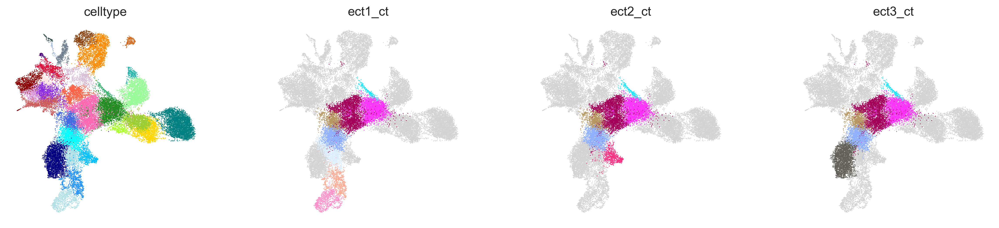

In [29]:
sc.pl.umap(adata, color = ['celltype','ect1_ct','ect2_ct','ect3_ct'], frameon = False, legend_loc = None)

In [30]:
test = adata.obs.astype('str').fillna('x')

In [31]:
pd.DataFrame(test[['ect1_ct','ect2_ct','ect3_ct','mes1_ct','mes2_ct','mes3_ct','endo1_ct']].value_counts())

count
ect1_ct                  ect2_ct                ect3_ct                 mes1_ct                  mes2_ct                  mes3_ct                  endo1_ct                       
nan                      nan                    nan                     nan                      nan                      nan                      nan                       10290
Caudal Mesoderm          Caudal Mesoderm        Caudal Mesoderm         Caudal Mesoderm          Caudal Mesoderm          Caudal Mesoderm          nan                        3439
Caudal Epiblast          Caudal Epiblast        Caudal Epiblast         Caudal Epiblast          Caudal Epiblast          Caudal Epiblast          Caudal Epiblast            2982
nan                      nan                    Floor Plate Neural Tube nan                      nan                      nan                      nan                        2947
                                                nan                     nan                      nan                      nan                      Visceral Endoderm          2151
Neural Progenitors       Neural Progenitors     Neural Progenitors      nan                      nan                      nan                      nan                        1891
nan                      nan                    nan                     nan                      Dermomyotome             nan                      nan                        1340
Roof Plate Neural Tube 1 nan                    nan                     nan                      nan                      nan                      nan                        1311
nan                      nan                    nan                     preSomitic/Wavefront     preSomitic/Wavefront     preSomitic/Wavefront     nan                        1279
                                                                        nan                      LP/Intermediate Mesoderm nan                      nan                        1236
NMPs                     NMPs                   NMPs                    nan                      nan                      nan                      nan                        1179
nan                      nan                    nan                     nan                      Pharyngeal Mesoderm      nan                      nan                        1040
Late Motor Neurons       nan                    nan                     nan                      nan                      nan                      nan                         931
Early Motor Neurons      nan                    nan                     nan                      nan                      nan                      nan                         872
nan                      nan                    nan                     Nascent Mesoderm         nan                      Nascent Mesoderm         nan                         818
                                                                        Cardiac Mesoderm         nan                      nan                      nan                         779
                         Roof Plate Neural Tube nan                     nan                      nan                      nan                      nan                         718
                         nan                    nan                     nan                      nan                      nan                      ExE Endoderm                657
                                                                                                 Sclerotome               nan                      nan                         592
                                                                                                 Somite                   nan                      nan                         569
                                                                                                 nan                      Endothelium              nan                         476
Primitive Streak         Primitive Streak       Primitiv

In [55]:
set(test['endo1_ct'].unique()) | set(test['mes1_ct'].unique())

{'Cardiac Mesoderm',
 'Cardiomyocytes',
 'Caudal Epiblast',
 'Caudal Mesoderm',
 'ExE Endoderm',
 'Nascent Mesoderm',
 'Parietal Endoderm',
 'Primitive Streak',
 'Roof Plate Neural Tube 1',
 'Visceral Endoderm',
 np.str_('nan'),
 'preSomitic/Wavefront'}

In [56]:
test['endo1_ct'].value_counts()/test['celltype'].value_counts()

Cardiac Mesoderm                 NaN
Cardiomyocytes                   NaN
Caudal Epiblast             1.000000
Caudal Mesoderm                  NaN
Dermomyotome                     NaN
Early Motor Neurons              NaN
Endothelium                      NaN
Epiblast                         NaN
Epidermis Progenitors            NaN
Erythrocytes                     NaN
ExE Endoderm                1.000000
Floor Plate Neural Tube          NaN
LP/Intermediate Mesoderm         NaN
Late Motor Neurons               NaN
Megakaryocytes                   NaN
Myotome                          NaN
NMPs                             NaN
Naive PGCs                       NaN
Nascent Mesoderm                 NaN
Neural Progenitors               NaN
PGCs                             NaN
Parietal Endoderm           1.000000
Pharyngeal Mesoderm              NaN
Primitive Streak            1.000000
Reprogramming PGCs               NaN
Roof Plate Neural Tube           NaN
Roof Plate Neural Tube 1    0.004556
S

In [33]:
test['mes1_ct'].value_counts()/test['celltype'].value_counts()

Cardiac Mesoderm            1.000000
Cardiomyocytes              1.000000
Caudal Epiblast             1.000000
Caudal Mesoderm             1.000000
Dermomyotome                     NaN
Early Motor Neurons              NaN
Endothelium                      NaN
Epiblast                         NaN
Epidermis Progenitors            NaN
Erythrocytes                     NaN
ExE Endoderm                     NaN
Floor Plate Neural Tube          NaN
LP/Intermediate Mesoderm         NaN
Late Motor Neurons               NaN
Megakaryocytes                   NaN
Myotome                          NaN
NMPs                             NaN
Naive PGCs                       NaN
Nascent Mesoderm            1.000000
Neural Progenitors               NaN
PGCs                             NaN
Parietal Endoderm                NaN
Pharyngeal Mesoderm              NaN
Primitive Streak            1.000000
Reprogramming PGCs               NaN
Roof Plate Neural Tube           NaN
Roof Plate Neural Tube 1    0.004556
S

In [34]:
test['mes2_ct'].value_counts()/test['celltype'].value_counts()

Cardiac Mesoderm                 NaN
Cardiomyocytes                   NaN
Caudal Epiblast             1.000000
Caudal Mesoderm             1.000000
Dermomyotome                1.000000
Early Motor Neurons              NaN
Endothelium                      NaN
Epiblast                         NaN
Epidermis Progenitors            NaN
Erythrocytes                     NaN
ExE Endoderm                     NaN
Floor Plate Neural Tube          NaN
LP/Intermediate Mesoderm    1.000000
Late Motor Neurons               NaN
Megakaryocytes                   NaN
Myotome                     1.000000
NMPs                             NaN
Naive PGCs                       NaN
Nascent Mesoderm                 NaN
Neural Progenitors               NaN
PGCs                             NaN
Parietal Endoderm                NaN
Pharyngeal Mesoderm         1.000000
Primitive Streak            1.000000
Reprogramming PGCs               NaN
Roof Plate Neural Tube           NaN
Roof Plate Neural Tube 1    0.004556
S

In [35]:
test['mes3_ct'].value_counts()/test['celltype'].value_counts()

Cardiac Mesoderm                 NaN
Cardiomyocytes                   NaN
Caudal Epiblast             1.000000
Caudal Mesoderm             1.000000
Dermomyotome                     NaN
Early Motor Neurons              NaN
Endothelium                 1.000000
Epiblast                         NaN
Epidermis Progenitors            NaN
Erythrocytes                1.000000
ExE Endoderm                     NaN
Floor Plate Neural Tube          NaN
LP/Intermediate Mesoderm         NaN
Late Motor Neurons               NaN
Megakaryocytes              1.000000
Myotome                          NaN
NMPs                             NaN
Naive PGCs                       NaN
Nascent Mesoderm            1.000000
Neural Progenitors               NaN
PGCs                             NaN
Parietal Endoderm                NaN
Pharyngeal Mesoderm              NaN
Primitive Streak            1.000000
Reprogramming PGCs               NaN
Roof Plate Neural Tube           NaN
Roof Plate Neural Tube 1    0.004556
S

In [36]:
test['ect3_ct'].value_counts()/test['celltype'].value_counts()

Cardiac Mesoderm            NaN
Cardiomyocytes              NaN
Caudal Epiblast             1.0
Caudal Mesoderm             1.0
Dermomyotome                NaN
Early Motor Neurons         NaN
Endothelium                 NaN
Epiblast                    NaN
Epidermis Progenitors       NaN
Erythrocytes                NaN
ExE Endoderm                NaN
Floor Plate Neural Tube     1.0
LP/Intermediate Mesoderm    NaN
Late Motor Neurons          NaN
Megakaryocytes              NaN
Myotome                     NaN
NMPs                        1.0
Naive PGCs                  NaN
Nascent Mesoderm            NaN
Neural Progenitors          1.0
PGCs                        NaN
Parietal Endoderm           NaN
Pharyngeal Mesoderm         NaN
Primitive Streak            1.0
Reprogramming PGCs          NaN
Roof Plate Neural Tube      NaN
Roof Plate Neural Tube 1    NaN
Sclerotome                  NaN
Somite                      NaN
Visceral Endoderm           NaN
mESCs                       NaN
nan     

In [49]:
test['ect2_ct'].value_counts()/test['celltype'].value_counts()

Cardiac Mesoderm            NaN
Cardiomyocytes              NaN
Caudal Epiblast             1.0
Caudal Mesoderm             1.0
Dermomyotome                NaN
Early Motor Neurons         NaN
Endothelium                 NaN
Epiblast                    NaN
Epidermis Progenitors       NaN
Erythrocytes                NaN
ExE Endoderm                NaN
Floor Plate Neural Tube     NaN
LP/Intermediate Mesoderm    NaN
Late Motor Neurons          NaN
Megakaryocytes              NaN
Myotome                     NaN
NMPs                        1.0
Naive PGCs                  NaN
Nascent Mesoderm            NaN
Neural Progenitors          1.0
PGCs                        NaN
Parietal Endoderm           NaN
Pharyngeal Mesoderm         NaN
Primitive Streak            1.0
Reprogramming PGCs          NaN
Roof Plate Neural Tube      1.0
Roof Plate Neural Tube 1    NaN
Sclerotome                  NaN
Somite                      NaN
Visceral Endoderm           NaN
mESCs                       NaN
nan     

In [38]:
test['ect1_ct'].value_counts()/test['celltype'].value_counts()

Cardiac Mesoderm            NaN
Cardiomyocytes              NaN
Caudal Epiblast             1.0
Caudal Mesoderm             1.0
Dermomyotome                NaN
Early Motor Neurons         1.0
Endothelium                 NaN
Epiblast                    NaN
Epidermis Progenitors       NaN
Erythrocytes                NaN
ExE Endoderm                NaN
Floor Plate Neural Tube     NaN
LP/Intermediate Mesoderm    NaN
Late Motor Neurons          1.0
Megakaryocytes              NaN
Myotome                     NaN
NMPs                        1.0
Naive PGCs                  NaN
Nascent Mesoderm            NaN
Neural Progenitors          1.0
PGCs                        NaN
Parietal Endoderm           NaN
Pharyngeal Mesoderm         NaN
Primitive Streak            1.0
Reprogramming PGCs          NaN
Roof Plate Neural Tube      NaN
Roof Plate Neural Tube 1    1.0
Sclerotome                  NaN
Somite                      NaN
Visceral Endoderm           NaN
mESCs                       NaN
nan     

In [39]:
test[test['ect1_ct'] == 'Roof Plate Neural Tube'].index

Index([], dtype='object', name='index')

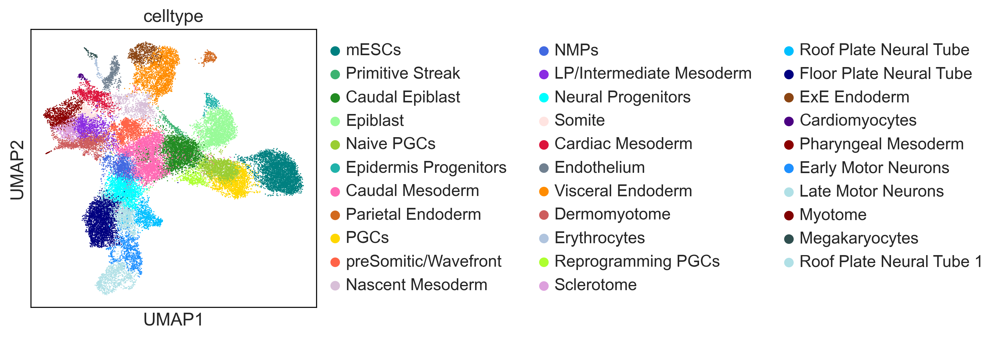

In [40]:
sc.pl.umap(adata,color='celltype', palette = list(color_pal.values()))

In [61]:
list(adata.obs['celltype'].cat.categories)

['mESCs',
 'Primitive Streak',
 'Caudal Epiblast',
 'Epiblast',
 'Naive PGCs',
 'Epidermis Progenitors',
 'Caudal Mesoderm',
 'Parietal Endoderm',
 'PGCs',
 'preSomitic/Wavefront',
 'Nascent Mesoderm',
 'NMPs',
 'LP/Intermediate Mesoderm',
 'Neural Progenitors',
 'Somite',
 'Cardiac Mesoderm',
 'Endothelium',
 'Visceral Endoderm',
 'Dermomyotome',
 'Erythrocytes',
 'Reprogramming PGCs',
 'Sclerotome',
 'Roof Plate Neural Tube',
 'Floor Plate Neural Tube',
 'ExE Endoderm',
 'Cardiomyocytes',
 'Pharyngeal Mesoderm',
 'Early Motor Neurons',
 'Late Motor Neurons',
 'Myotome',
 'Megakaryocytes',
 'Roof Plate Neural Tube 1']

In [73]:
trajectories = ['x','Pluripotent','Pluripotent','x','x','x','Pluripotent 2','End1', 'x', 
                'Mesoderm Progenitors', 'Mesoderm Progenitors 2','Ectoderm Progenitors','Mes2','Ectoderm Progenitors',
               'Mes2','Mes1','Mes3','End1','Mes2','Mes3','x','Mes2','Ect2','Ect3','End1','Mes1','Mes2','Ect1','Ect1','Mes2','Mes3','Ect1']


In [74]:
trajectories_dict = dict(zip(list(adata.obs['celltype'].cat.categories),trajectories))

In [75]:
adata.obs['trajectories'] = (
    adata.obs["celltype"]
    .map(lambda x: trajectories_dict.get(x, x))
    .astype("category")
)

In [84]:
pal = ['#6AAED6', '#3787C0', '#105BA4', '#D6E6F4',
      '#FC6832',
      '#DF64AF', '#DF2179', '#A90649',
      '#E1D4E8','#CDA0CD',
      '#2C8F4B','#97D385', 'lightgrey']

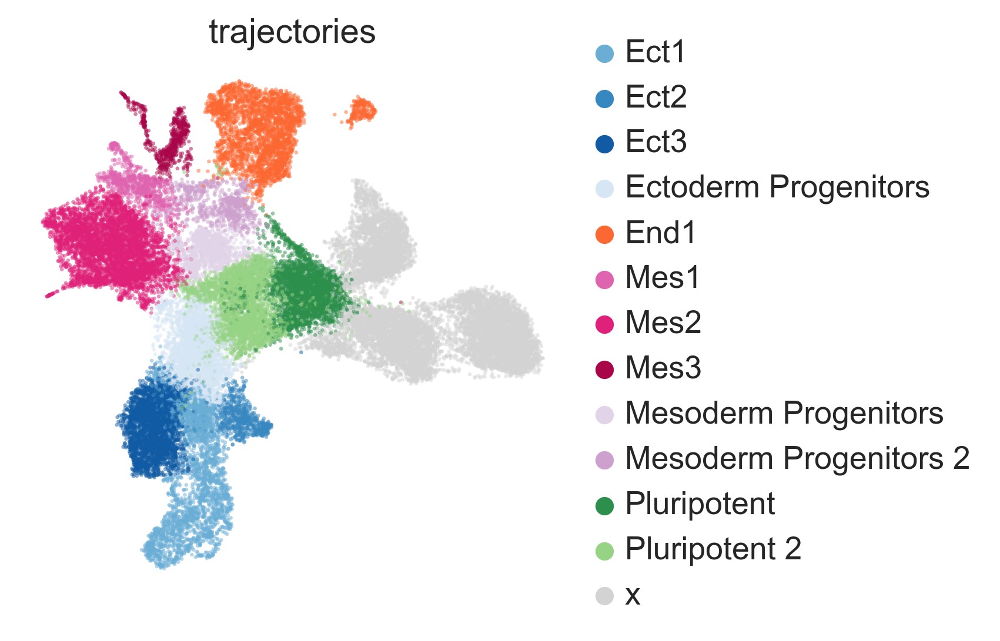

In [90]:
sc.pl.umap(adata, color = 'trajectories', palette = pal, size = 10, alpha = 0.5, frameon = False)

In [72]:
adata.obs[['trajectories','celltype']].value_counts()

trajectories            celltype                
x                       mESCs                       3896
Mesoderm Progenitors    Caudal Mesoderm             3439
Pluripotent             Caudal Epiblast             2982
Ect3                    Floor Plate Neural Tube     2947
x                       Epiblast                    2522
End1                    Visceral Endoderm           2151
Ectoderm Progenitors    Neural Progenitors          1891
x                       Naive PGCs                  1834
                        PGCs                        1378
Mes2                    Dermomyotome                1340
Ect1                    Roof Plate Neural Tube 1    1317
Mesoderm Progenitors 2  preSomitic/Wavefront        1279
Mes2                    LP/Intermediate Mesoderm    1236
Ectoderm Progenitors    NMPs                        1179
Mes2                    Pharyngeal Mesoderm         1040
Ect1                    Late Motor Neurons           931
                        Early Motor Neu

In [77]:
adata.uns['lin_day_colors']

array(['#d6e6f4', '#abd0e6', '#6aaed6', '#3787c0', '#105ba4', '#ffea9b',
       '#fece6a', '#fea245', '#fc6832', '#ea2920', '#c20325', '#e1d4e8',
       '#cda0cd', '#df64af', '#df2179', '#a90649', '#f3fab6', '#ccea9d',
       '#97d385', '#58b669', '#2c8f4b', '#056c39'], dtype=object)

In [95]:
adata.obs[['trajectories','ect1_ld','ect2_ld','ect3_ld',
                         'mes1_ld','mes2_ld','mes3_ld',
                          'pluri1_ld','pluri2_ld','endo1_ld']].to_csv('dfs/20250304_trajectories.csv')